In [1]:
import mne
import pandas as pd
import numpy as np
from scipy.signal import spectrogram, blackman, welch
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import scipy.signal as signal

from collections import Counter

In [2]:
import matplotlib.pyplot as plt

In [3]:
# Only needed pre-3.6!
def most_common(lst):
    data = Counter(lst)
    return max(lst, key=data.get)

In [4]:
raw_isa_L = mne.io.read_raw_fif(
    'Dados/PEAC_Ativo - Análise - Aline e André/Isabelle Vasconcelos/resampled/isabelle Vasconceles PEAC R ativo.fif',
    preload=True,
    verbose=False
)

/tmp/ipykernel_24524/2914189874.py:1: RuntimeWarning: This filename (Dados/PEAC_Ativo - Análise - Aline e André/Isabelle Vasconcelos/resampled/isabelle Vasconceles PEAC R ativo.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw_isa_L = mne.io.read_raw_fif(


Using matplotlib as 2D backend.


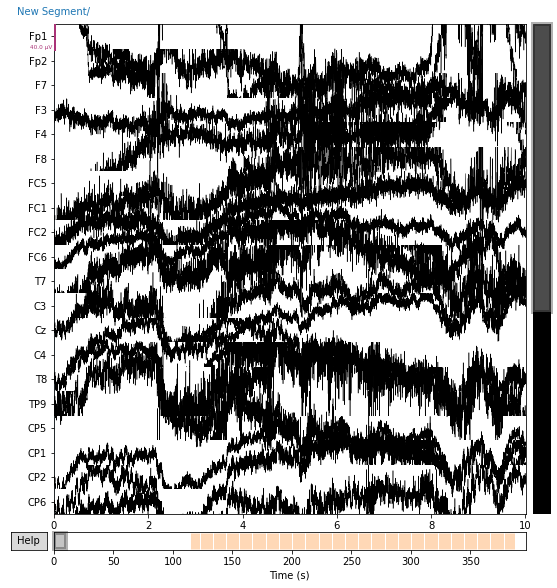

In [5]:
raw_isa_L.plot();

In [6]:
raw_isa_L.info

<Info | 9 non-empty values
 bads: []
 ch_names: Fp1, Fp2, F7, F3, F4, F8, FC5, FC1, FC2, FC6, T7, C3, Cz, C4, ...
 chs: 32 EEG, 2 misc
 custom_ref_applied: False
 file_id: 4 items (dict)
 highpass: 0.0 Hz
 lowpass: 500.0 Hz
 meas_date: 2021-12-02 11:27:24 UTC
 meas_id: 4 items (dict)
 nchan: 34
 projs: []
 sfreq: 1000.0 Hz
>

In [7]:
sampling_freq = raw_isa_L.info['sfreq']

In [8]:
df_isa_L = pd.read_csv('Dados/PEAC_Ativo - Análise - Aline e André/Isabelle Vasconcelos/resampled/isabelle Vasconceles PEAC R ativo.csv')

In [9]:
df_isa_L

,time,Fp1,Fp2,F7,F3,F4,F8,FC5,FC1,FC2,...,P3,Pz,P4,P8,PO9,O1,Oz,O2,PO10,audio
0,0.000,2539.277188,-4153.751540,-7042.483609,-7950.860249,-12092.041531,-11515.391375,1152.295574,5336.390171,5665.142687,...,-9750.673661,-2861.954884,-6129.907253,-8131.877033,-12028.155171,2051.735729,-392.712656,-5963.319230,-466.388100,-42379.839055
1,0.001,2539.887865,-4162.250108,-7060.767645,-7967.309951,-12099.108475,-11519.763056,1137.539073,5360.732398,5664.146484,...,-9737.904270,-2850.157778,-6109.031923,-8098.483062,-12015.974734,2066.202679,-379.243527,-5963.725011,-441.470844,-42445.158809
2,0.002,2547.561843,-4153.891604,-7059.985292,-7964.552174,-12089.147212,-11504.897893,1129.363846,5360.654447,5668.628159,...,-9726.880173,-2841.410762,-6096.412535,-8101.109182,-12023.739568,2075.700739,-372.384899,-5952.547510,-434.182381,-42532.410285
3,0.003,2550.129138,-4162.062700,-7059.732071,-7974.224403,-12093.717764,-11506.837748,1131.030610,5361.115498,5668.017191,...,-9731.083829,-2848.841059,-6115.205856,-8101.033024,-11992.993353,2078.561333,-376.126183,-5955.182190,-447.904174,-42641.665390
4,0.004,2546.134625,-4162.263045,-7043.036674,-7980.686739,-12089.679433,-11505.646704,1091.356313,5356.839688,5663.297049,...,-9726.777850,-2842.228945,-6112.346253,-8083.157417,-12002.889821,2080.446007,-369.554681,-5949.065228,-428.648940,-42690.647779
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
396295,396.295,2572.321775,-3744.932544,-6918.368370,-7744.174441,-11643.458255,-10900.045821,1250.135554,5373.968994,5257.704862,...,-9664.761475,-2800.043457,-6476.403712,-7886.924911,-11947.083501,885.823364,-117.555533,-6195.267263,-722.267165,-43179.127270
396296,396.296,2568.580874,-3740.799724,-6941.463062,-7748.586159,-11649.370286,-10894.271367,1234.964074,5379.809647,5263.072776,...,-9672.377951,-2798.215384,-6469.263909,-7882.177389,-11935.547817,890.429282,-116.468076,-6187.423400,-712.986069,-41947.508427
396297,396.297,2569.647175,-3743.202782,-6935.980003,-7747.586664,-11645.924463,-10890.135531,1241.915008,5375.648670,5264.897618,...,-9666.925617,-2793.488509,-6474.483318,-7895.174899,-11937.588559,888.859703,-119.457415,-6196.023678,-722.108542,-42893.250177
396298,396.298,2574.958040,-3741.214639,-6924.567617,-7744.002442,-11650.385230,-10896.490200,1241.896784,5384.461900,5265.960490,...,-9678.102443,-2805.212008,-6474.615134,-7899.774498,-11942.624400,878.946512,-124.220146,-6202.338448,-724.723454,-41936.538991


In [10]:
segments_isa_L = pd.read_csv('Dados/PEAC_Ativo - Análise - Aline e André/Isabelle Vasconcelos/isabelle Vasconceles PEAC R ativo audio wav segments.csv')

In [11]:
Counter(segments_isa_L['text'])

Counter({nan: 1, 'bá': 239, 'dá': 60})

In [12]:
canais_isa_L  = df_isa_L.drop(columns = ['time', 'audio'])

# normalized_canais_isa_L=(canais_isa_L-canais_isa_L.mean())/canais_isa_L.std()

b, a = signal.butter(2, [0.1,30], btype ='bandpass', fs = sampling_freq )
y_isa_L = signal.filtfilt(b, a, np.array(canais_isa_L).T)

filtered_canais_isa_L = pd.DataFrame(data = y_isa_L.T, columns = canais_isa_L.columns )

In [13]:
filtered_canais_isa_L

,Fp1,Fp2,F7,F3,F4,F8,FC5,FC1,FC2,FC6,...,P7,P3,Pz,P4,P8,PO9,O1,Oz,O2,PO10
0,104.437608,168.459427,54.926743,4.948771,-20.525966,1.890762,-16.013171,-9.859837,-12.104641,-12.937766,...,-20.899671,-15.721606,-32.408197,-17.691803,-20.926661,-15.706692,-15.579287,-14.245166,-23.487895,-22.114672
1,105.063988,166.941248,53.088301,1.650678,-20.607918,2.987506,-21.314283,-6.806349,-11.633195,-9.994530,...,-18.753994,-13.043167,-29.987172,-15.280753,-15.326062,-13.270378,-12.253473,-10.864638,-21.016766,-16.850664
2,105.680539,165.457173,51.317376,-1.564087,-20.684472,4.069717,-26.463668,-3.839472,-11.166396,-7.135371,...,-16.657212,-10.430457,-27.623667,-12.922561,-9.867887,-10.946048,-9.009793,-7.550497,-18.567719,-11.728358
3,106.283166,164.048367,49.674346,-4.616150,-20.752276,5.123993,-31.330151,-1.034605,-10.705688,-4.418151,...,-14.656740,-7.947033,-25.366536,-10.677174,-4.677028,-8.820494,-5.939280,-4.370616,-16.175276,-6.851442
4,106.874222,162.753461,48.204203,-7.439598,-20.808937,6.140871,-35.796461,1.553930,-10.251719,-1.886232,...,-12.791841,-5.639858,-23.251963,-8.582197,0.146482,-6.967592,-3.114202,-1.380202,-13.871542,-2.305005
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
396295,-8.758788,-4.750665,-3.107632,-12.459707,-14.251420,-16.911314,-44.052540,5.699402,1.619894,-1.340363,...,4.307798,31.427311,13.621392,29.406917,9.961782,18.700412,21.130124,22.116131,25.437116,7.048195
396296,-7.971509,-4.350015,-2.719461,-11.513973,-13.048386,-15.451600,-40.914681,5.125002,1.436922,-1.177515,...,4.019912,28.734472,12.300928,26.885896,9.036961,17.271721,19.260647,20.201184,23.229378,6.448555
396297,-7.154747,-3.918275,-2.346678,-10.476465,-11.787503,-13.942724,-37.491462,4.549261,1.262915,-1.017075,...,3.779189,25.945157,11.033864,24.301067,8.112329,15.822206,17.435361,18.278347,20.969109,5.834979
396298,-6.319910,-3.465331,-1.986820,-9.369012,-10.487846,-12.406538,-33.853879,3.976684,1.096356,-0.858719,...,3.575072,23.098149,9.817265,21.682375,7.198068,14.361680,15.658302,16.363655,18.685565,5.216963


In [14]:
filtered_canais_isa_L.mean(axis = 1)

0        -3.939350
1        -2.177709
2        -0.455758
3         1.190118
4         2.732694
            ...   
396295    0.172174
396296    0.112049
396297    0.091108
396298    0.102827
396299    0.137211
Length: 396300, dtype: float64

In [15]:
segments_isa_L_ba = segments_isa_L[segments_isa_L['text'] == 'bá']
segments_isa_L_da = segments_isa_L[segments_isa_L['text'] == 'dá']

In [16]:
segments_isa_L_ba.shape

(239, 6)

In [17]:
segments_isa_L_da.shape

(60, 6)

In [18]:
df_isa_L.columns

Index(['time', 'Fp1', 'Fp2', 'F7', 'F3', 'F4', 'F8', 'FC5', 'FC1', 'FC2',
       'FC6', 'T7', 'C3', 'Cz', 'C4', 'T8', 'TP9', 'CP5', 'CP1', 'CP2', 'CP6',
       'TP10', 'P7', 'P3', 'Pz', 'P4', 'P8', 'PO9', 'O1', 'Oz', 'O2', 'PO10',
       'audio'],
      dtype='object')

In [19]:
canais_isa_L  = df_isa_L.drop(columns = ['time', 'audio'])

In [20]:
list_channels_left = ["C3", "T7", "CP5", "TP9", "P7", "P3"]
list_channels_right = ["C4", "T8", "CP6", "TP10", "P8", "P4"]

In [21]:
canais_isa_L_mean_R = canais_isa_L.mean()[list_channels_right]

In [22]:
canais_isa_L_mean_R

C4      -7980.931955
T8      -1307.344729
CP6    -14006.826725
TP10     5810.294640
P8      -7960.885818
P4      -6356.293859
dtype: float64

In [23]:
canais_isa_L_std_R = canais_isa_L.std()[list_channels_right]

In [24]:
canais_isa_L_mean_L = canais_isa_L.mean()[list_channels_left]

In [25]:
canais_isa_L_std_L = canais_isa_L.std()[list_channels_left]

In [26]:
segments_isa_L_ba

,Unnamed: 0,xmin,xmax,type_seg,segment_path,text
1,1,115.020,115.885,Stimulus/S 1,Dados/PEAC_Ativo - Análise - Aline e André/Isa...,bá
3,3,116.790,117.699,Stimulus/S 1,Dados/PEAC_Ativo - Análise - Aline e André/Isa...,bá
4,4,117.699,118.608,Stimulus/S 1,Dados/PEAC_Ativo - Análise - Aline e André/Isa...,bá
5,5,118.608,119.517,Stimulus/S 1,Dados/PEAC_Ativo - Análise - Aline e André/Isa...,bá
6,6,119.517,120.426,Stimulus/S 1,Dados/PEAC_Ativo - Análise - Aline e André/Isa...,bá
...,...,...,...,...,...,...
295,295,382.218,383.127,Stimulus/S 1,Dados/PEAC_Ativo - Análise - Aline e André/Isa...,bá
296,296,383.127,384.036,Stimulus/S 1,Dados/PEAC_Ativo - Análise - Aline e André/Isa...,bá
297,297,384.036,384.945,Stimulus/S 1,Dados/PEAC_Ativo - Análise - Aline e André/Isa...,bá
298,298,384.945,385.854,Stimulus/S 1,Dados/PEAC_Ativo - Análise - Aline e André/Isa...,bá


In [27]:
segments_isa_L_da

,Unnamed: 0,xmin,xmax,type_seg,segment_path,text
2,2,115.885,116.790,Stimulus/S 1,Dados/PEAC_Ativo - Análise - Aline e André/Isa...,dá
13,13,125.884,126.789,Stimulus/S 1,Dados/PEAC_Ativo - Análise - Aline e André/Isa...,dá
15,15,127.702,128.607,Stimulus/S 1,Dados/PEAC_Ativo - Análise - Aline e André/Isa...,dá
21,21,133.156,134.061,Stimulus/S 1,Dados/PEAC_Ativo - Análise - Aline e André/Isa...,dá
23,23,134.974,135.883,Stimulus/S 1,Dados/PEAC_Ativo - Análise - Aline e André/Isa...,dá
24,24,135.883,136.788,Stimulus/S 1,Dados/PEAC_Ativo - Análise - Aline e André/Isa...,dá
26,26,137.701,138.606,Stimulus/S 1,Dados/PEAC_Ativo - Análise - Aline e André/Isa...,dá
28,28,139.519,140.424,Stimulus/S 1,Dados/PEAC_Ativo - Análise - Aline e André/Isa...,dá
31,31,142.246,143.151,Stimulus/S 1,Dados/PEAC_Ativo - Análise - Aline e André/Isa...,dá
33,33,144.064,144.969,Stimulus/S 1,Dados/PEAC_Ativo - Análise - Aline e André/Isa...,dá


## Array de tempos dos segmentos

In [28]:
isa_L_ba_eeg_times = []
for index, row in segments_isa_L_ba.iterrows():
    isa_L_ba_eeg_times.append(raw_isa_L.get_data(
        tmin=row['xmin'], tmax=row['xmax'],
        return_times=True
    )[1])

In [29]:
isa_L_da_eeg_times = []
for index, row in segments_isa_L_da.iterrows():
    isa_L_da_eeg_times.append(raw_isa_L.get_data(
        tmin=row['xmin'], tmax=row['xmax'],
        return_times=True
    )[1])

In [30]:
df_CAR = raw_isa_L.to_data_frame(picks=['eeg'],start=int(segments_isa_L_da.iloc[2]['xmin']*1000), stop=int(segments_isa_L_da.iloc[2]['xmax']*1000))
# canais_CAR  = df_CAR.drop(columns = ['time', 'audio'])
canais_CAR = df_CAR[list_channels_right+list_channels_left]

In [31]:
canais_CAR

,C4,T8,CP6,TP10,P8,P4,C3,T7,CP5,TP9,P7,P3
0,-8032.898843,-1174.435611,-14145.021572,5975.724790,-7905.419768,-6199.747767,-2574.393410,-10096.030448,-13052.387235,-12281.350053,-8640.388593,-9796.042148
1,-8023.112686,-1177.250950,-14146.085317,5979.129573,-7901.173522,-6194.202763,-2578.230020,-10106.918185,-13049.731512,-12294.109166,-8635.053864,-9811.410417
2,-8026.715010,-1179.196722,-14145.180188,5978.492563,-7907.000106,-6187.738078,-2569.642394,-10096.553589,-13043.552772,-12287.915874,-8644.224476,-9812.320639
3,-8030.962712,-1188.241369,-14135.891706,5975.497053,-7911.142306,-6198.382071,-2578.397913,-10087.529951,-13044.823154,-12290.117578,-8637.270847,-9806.295422
4,-8026.337388,-1196.051924,-14142.214509,5973.765739,-7906.995012,-6195.357457,-2575.095175,-10104.995150,-13050.446011,-12285.378021,-8635.186286,-9798.171819
...,...,...,...,...,...,...,...,...,...,...,...,...
900,-7977.489545,-1191.597858,-14119.663418,5983.733069,-7886.874818,-6171.429755,-2570.497318,-10109.210110,-13040.907236,-12318.845953,-8631.196153,-9771.274801
901,-7971.371196,-1188.779517,-14117.137207,5984.143432,-7881.828216,-6163.916606,-2571.760060,-10120.192435,-13040.102515,-12317.886983,-8636.634928,-9774.420196
902,-7970.048427,-1182.348574,-14109.542567,5986.602705,-7872.232688,-6168.466987,-2564.645269,-10117.028850,-13029.645514,-12302.879600,-8626.381654,-9761.525023
903,-7977.122110,-1176.308441,-14110.959923,5967.739795,-7875.340248,-6159.581592,-2572.715757,-10109.117706,-13036.508194,-12307.549307,-8630.827990,-9772.204668


In [32]:
sampling_freq

1000.0

In [33]:

# b, a = signal.butter(3, [0.1,30], btype ='bandpass', fs = sampling_freq )
y_CAR = signal.filtfilt(b, a, np.array(canais_CAR).T)

In [34]:
filtered_canais = pd.DataFrame(data = y_CAR.T, columns = canais_CAR.columns )
# filtered_canais.mean(axis = 1)

In [35]:
filtered_canais

,C4,T8,CP6,TP10,P8,P4,C3,T7,CP5,TP9,P7,P3
0,-21.132171,-1.986279,-21.702003,-4.713961,-18.450430,-17.957268,4.380224,1.125965,-0.466484,11.109850,-5.961678,-14.953597
1,-19.614701,-3.464783,-20.249045,-4.867798,-18.406975,-17.004230,4.367941,0.821716,0.046961,10.262303,-5.531815,-15.920457
2,-18.100023,-4.882281,-18.797345,-5.009373,-18.351447,-16.083050,4.350635,0.542716,0.549779,9.437530,-5.095341,-16.841143
3,-16.607172,-6.173350,-17.368157,-5.150216,-18.281643,-15.228339,4.322457,0.287381,1.024016,8.648823,-4.665812,-17.696358
4,-15.151451,-7.278768,-15.983245,-5.298598,-18.196595,-14.468899,4.277142,0.053292,1.457673,7.901373,-4.256443,-18.480424
...,...,...,...,...,...,...,...,...,...,...,...,...
900,0.280212,-16.763992,-26.000785,4.643643,-13.073656,-8.008262,15.231743,-5.425946,12.558977,1.505999,2.675531,4.619918
901,0.458048,-15.366738,-23.664895,4.648208,-11.767603,-7.039056,14.097456,-4.832685,11.756255,1.443796,2.639844,4.483000
902,0.538926,-13.823528,-21.293716,4.358537,-10.495310,-6.113635,12.835955,-4.253644,10.837892,1.333442,2.549034,4.231382
903,0.537128,-12.177376,-18.914754,3.831740,-9.265069,-5.238515,11.478615,-3.689276,9.829424,1.183611,2.412044,3.885980


In [36]:
notch_freq = 60.0  # Frequency to be removed from signal (Hz)
quality_factor = 30.0  # Quality factor
 
# Design a notch filter using signal.iirnotch
b_notch, a_notch = signal.iirnotch(notch_freq, quality_factor, sampling_freq)

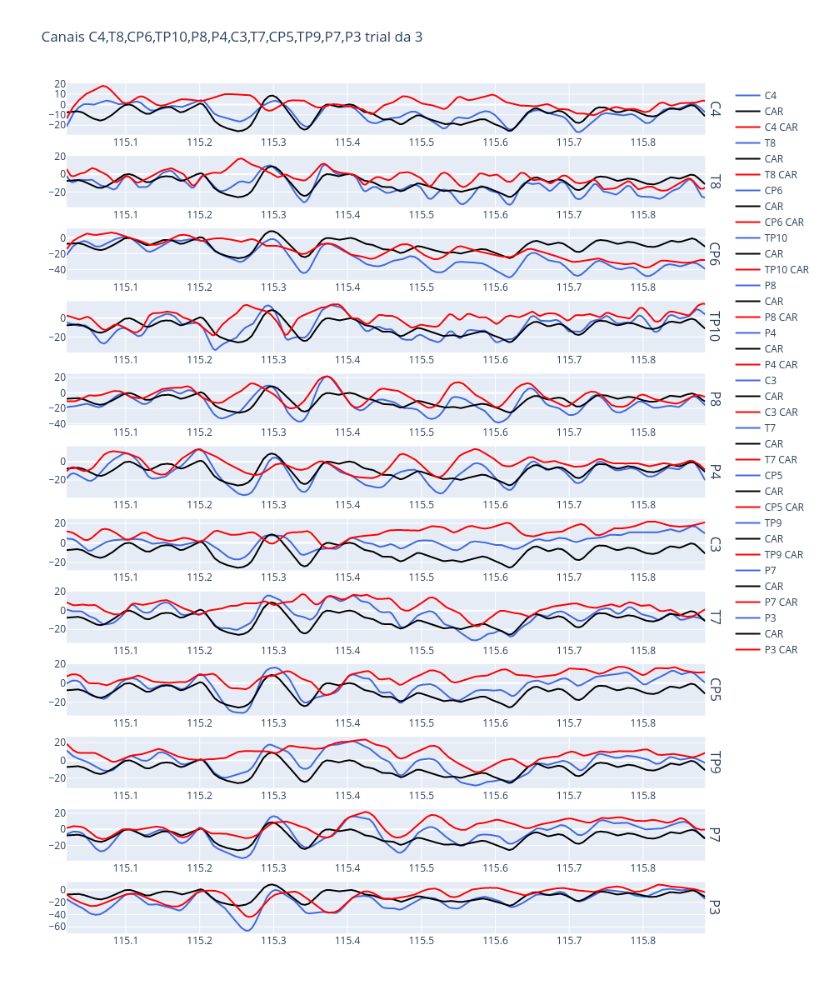

In [37]:
fig = make_subplots(rows=filtered_canais.shape[1], cols=1 , row_titles=list_channels_right+list_channels_left)
i = 0

for channel in filtered_canais:
    i+=1
    fig.append_trace(go.Scatter(
        x=isa_L_ba_eeg_times[0],
        y=filtered_canais[channel],
        name=channel,
        line=dict(color='royalblue')
    ), row=i, col=1)

    fig.append_trace(go.Scatter(
        x=isa_L_ba_eeg_times[0],
        y=filtered_canais.mean(axis = 1),
        name='CAR',
        line=dict(color='black')
    ), row=i, col=1)

    fig.append_trace(go.Scatter(
        x=isa_L_ba_eeg_times[0],
        y=filtered_canais[channel]-filtered_canais.mean(axis = 1),
        name=channel + ' CAR',
        line=dict(color='red')
    ), row=i, col=1)

fig.update_layout(height=1200,title_text=f"Canais {','.join(filtered_canais.columns)} trial da 3")
fig.show()

In [38]:
filtered_canais

,C4,T8,CP6,TP10,P8,P4,C3,T7,CP5,TP9,P7,P3
0,-21.132171,-1.986279,-21.702003,-4.713961,-18.450430,-17.957268,4.380224,1.125965,-0.466484,11.109850,-5.961678,-14.953597
1,-19.614701,-3.464783,-20.249045,-4.867798,-18.406975,-17.004230,4.367941,0.821716,0.046961,10.262303,-5.531815,-15.920457
2,-18.100023,-4.882281,-18.797345,-5.009373,-18.351447,-16.083050,4.350635,0.542716,0.549779,9.437530,-5.095341,-16.841143
3,-16.607172,-6.173350,-17.368157,-5.150216,-18.281643,-15.228339,4.322457,0.287381,1.024016,8.648823,-4.665812,-17.696358
4,-15.151451,-7.278768,-15.983245,-5.298598,-18.196595,-14.468899,4.277142,0.053292,1.457673,7.901373,-4.256443,-18.480424
...,...,...,...,...,...,...,...,...,...,...,...,...
900,0.280212,-16.763992,-26.000785,4.643643,-13.073656,-8.008262,15.231743,-5.425946,12.558977,1.505999,2.675531,4.619918
901,0.458048,-15.366738,-23.664895,4.648208,-11.767603,-7.039056,14.097456,-4.832685,11.756255,1.443796,2.639844,4.483000
902,0.538926,-13.823528,-21.293716,4.358537,-10.495310,-6.113635,12.835955,-4.253644,10.837892,1.333442,2.549034,4.231382
903,0.537128,-12.177376,-18.914754,3.831740,-9.265069,-5.238515,11.478615,-3.689276,9.829424,1.183611,2.412044,3.885980


In [39]:
isa_L_ba_eeg_CAR_mean_segm = []
for index, row in segments_isa_L_ba.iterrows():
    df_CAR = raw_isa_L.to_data_frame(picks=['eeg'],start=int(row['xmin']*1000), stop=int(row['xmax']*1000))
    canais_CAR = df_CAR[list_channels_right+list_channels_left]

    # normalized_canais_CAR=(canais_CAR-canais_CAR.mean())/canais_CAR.std()

    # b, a = signal.butter(3, [1,30], btype ='bandpass', fs = sampling_freq )
    y_CAR = signal.filtfilt(b, a, np.array(canais_CAR).T)

    filtered_canais = pd.DataFrame(data = y_CAR.T, columns = canais_CAR.columns )
    # CAR_canais = filtered_canais.sub(filtered_canais.mean(axis = 1), axis = 0)
    
    isa_L_ba_eeg_CAR_mean_segm.append(filtered_canais.mean(axis = 1).to_numpy())

In [40]:
isa_L_da_eeg_CAR_mean_segm = []
for index, row in segments_isa_L_da.iterrows():
    df_CAR = raw_isa_L.to_data_frame(picks=['eeg'],start=int(row['xmin']*1000), stop=int(row['xmax']*1000))
    canais_CAR = df_CAR[list_channels_right+list_channels_left]    # canais_CAR = df_CAR[["C4", "T8", "CP6", "TP10", "P8", "P4", "C3", "T7", "CP5", "TP9", "P7", "P3"]]

    # normalized_canais_CAR=(canais_CAR-canais_CAR.mean())/canais_CAR.std() # retirar normalização

    # b, a = signal.butter(3, [1,30], btype ='bandpass', fs = sampling_freq ) # 0.1 Hz menor frequencia
    y_CAR = signal.filtfilt(b, a, canais_CAR.T)

    filtered_canais = pd.DataFrame(data = y_CAR.T, columns = canais_CAR.columns )
    # CAR_canais = filtered_canais.sub(filtered_canais.mean(axis = 1), axis = 0)
    
    isa_L_da_eeg_CAR_mean_segm.append(filtered_canais.mean(axis = 1))

In [41]:
isa_L_ba_eeg_R_channels = []
for index, row in segments_isa_L_ba.iterrows():
    isa_L_ba_eeg_R_channels.append(raw_isa_L.to_data_frame(
        picks=list_channels_right,
        start=int(row['xmin']*1000), stop=int(row['xmax']*1000)
    ).drop(columns =['time']))

In [42]:
isa_L_da_eeg_R_channels = []
for index, row in segments_isa_L_da.iterrows():
    isa_L_da_eeg_R_channels.append(raw_isa_L.to_data_frame(
        picks=list_channels_right,
        start=int(row['xmin']*1000), stop=int(row['xmax']*1000)
    ).drop(columns =['time']))

In [43]:
isa_L_ba_eeg_L_channels = []
for index, row in segments_isa_L_ba.iterrows():
    isa_L_ba_eeg_L_channels.append(raw_isa_L.to_data_frame(
        picks=list_channels_left,
        start=int(row['xmin']*1000), stop=int(row['xmax']*1000)
    ).drop(columns =['time']))

In [44]:
isa_L_da_eeg_L_channels = []
for index, row in segments_isa_L_da.iterrows():
    isa_L_da_eeg_L_channels.append(raw_isa_L.to_data_frame(
        picks=list_channels_left,
        start=int(row['xmin']*1000), stop=int(row['xmax']*1000)
    ).drop(columns =['time']))

In [45]:
y_ba_R = signal.filtfilt(b, a, np.array(isa_L_ba_eeg_R_channels[0]).T)

filtered_canais_ba_R = pd.DataFrame(data = y_ba_R.T, columns = list_channels_right)
CAR_canais_ba_R = filtered_canais_ba_R.sub(isa_L_ba_eeg_CAR_mean_segm[0], axis = 0)

In [46]:
y_ba_L = signal.filtfilt(b, a, np.array(isa_L_ba_eeg_L_channels[0]).T)

filtered_canais_ba_L = pd.DataFrame(data = y_ba_L.T, columns = list_channels_left)
CAR_canais_ba_L = filtered_canais_ba_L.sub(isa_L_ba_eeg_CAR_mean_segm[0], axis = 0)

In [47]:
y_da_R = signal.filtfilt(b, a, np.array(isa_L_da_eeg_R_channels[1]).T)

filtered_canais_da_R = pd.DataFrame(data = y_da_R.T, columns = list_channels_right)
CAR_canais_da_R = filtered_canais_da_R.sub(isa_L_da_eeg_CAR_mean_segm[0], axis = 0)

In [48]:
y_da_L = signal.filtfilt(b, a, np.array(isa_L_da_eeg_L_channels[1]).T)

filtered_canais_da_L = pd.DataFrame(data = y_da_L.T, columns = list_channels_left)
CAR_canais_da_L = filtered_canais_da_L.sub(isa_L_da_eeg_CAR_mean_segm[0], axis = 0)

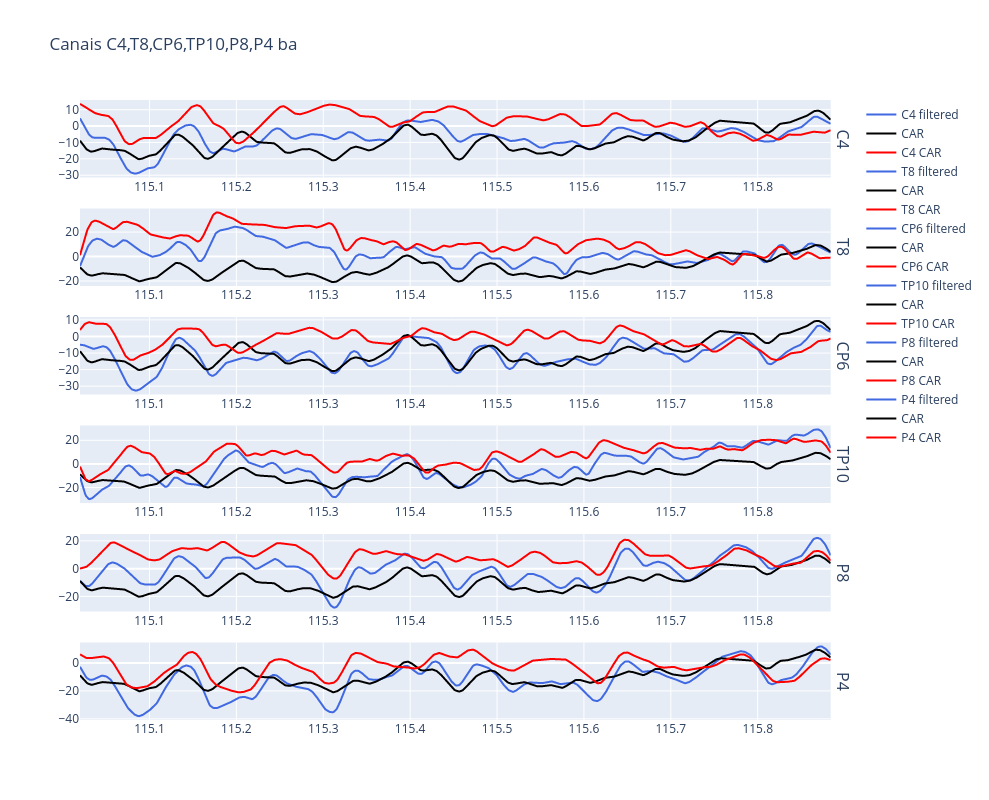

In [49]:
fig = make_subplots(rows=filtered_canais_ba_R.shape[1], cols=1 , row_titles=list_channels_right)
i = 0
for channel in filtered_canais_ba_R:
    i+=1
    # fig.append_trace(go.Scatter(
    #     x=isa_L_ba_eeg_times[0],
    #     y=isa_L_ba_eeg_R_channels[0][channel],
    #     name=channel,
    #     line=dict(color='green')
    # ), row=1, col=1)
    
    fig.append_trace(go.Scatter(
        x=isa_L_ba_eeg_times[0],
        y=filtered_canais_ba_R[channel],
        name=channel + ' filtered',
        line=dict(color='royalblue')
    ), row=i, col=1)

    fig.append_trace(go.Scatter(
        x=isa_L_ba_eeg_times[0],
        y=isa_L_ba_eeg_CAR_mean_segm[0],
        name='CAR',
        line=dict(color='black')
    ), row=i, col=1)

    fig.append_trace(go.Scatter(
        x=isa_L_ba_eeg_times[0],
        y=CAR_canais_ba_R[channel],
        name=channel + ' CAR',
        line=dict(color='red')
    ), row=i, col=1)

fig.update_layout(height=800,title_text=f"Canais {','.join(filtered_canais_ba_R.columns)} ba")

fig.show()


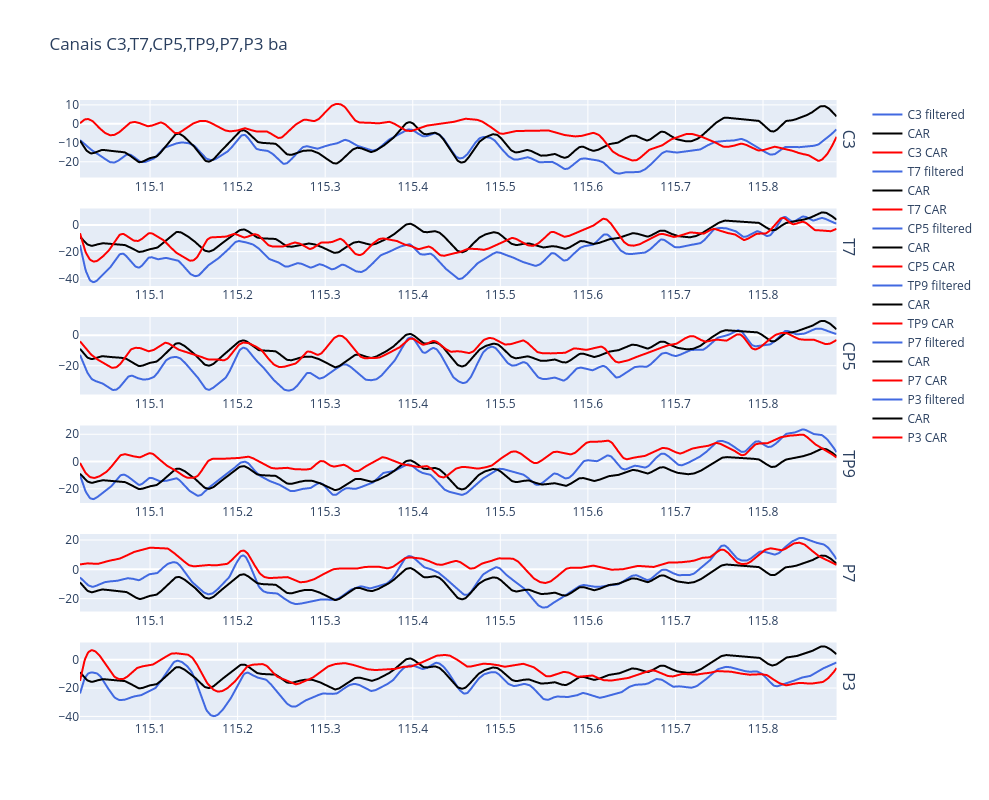

In [50]:
fig = make_subplots(rows=filtered_canais_ba_L.shape[1], cols=1 , row_titles=list_channels_left)
i = 0
for channel in filtered_canais_ba_L:
    i+=1
    # fig.append_trace(go.Scatter(
    #     x=isa_L_ba_eeg_times[0],
    #     y=isa_L_ba_eeg_R_channels[0][channel],
    #     name=channel,
    #     line=dict(color='green')
    # ), row=1, col=1)
    
    fig.append_trace(go.Scatter(
        x=isa_L_ba_eeg_times[0],
        y=filtered_canais_ba_L[channel],
        name=channel + ' filtered',
        line=dict(color='royalblue')
    ), row=i, col=1)

    fig.append_trace(go.Scatter(
        x=isa_L_ba_eeg_times[0],
        y=isa_L_ba_eeg_CAR_mean_segm[0],
        name='CAR',
        line=dict(color='black')
    ), row=i, col=1)

    fig.append_trace(go.Scatter(
        x=isa_L_ba_eeg_times[0],
        y=CAR_canais_ba_L[channel],
        name=channel + ' CAR',
        line=dict(color='red')
    ), row=i, col=1)

fig.update_layout(height=800,title_text=f"Canais {','.join(filtered_canais_ba_L.columns)} ba")

fig.show()


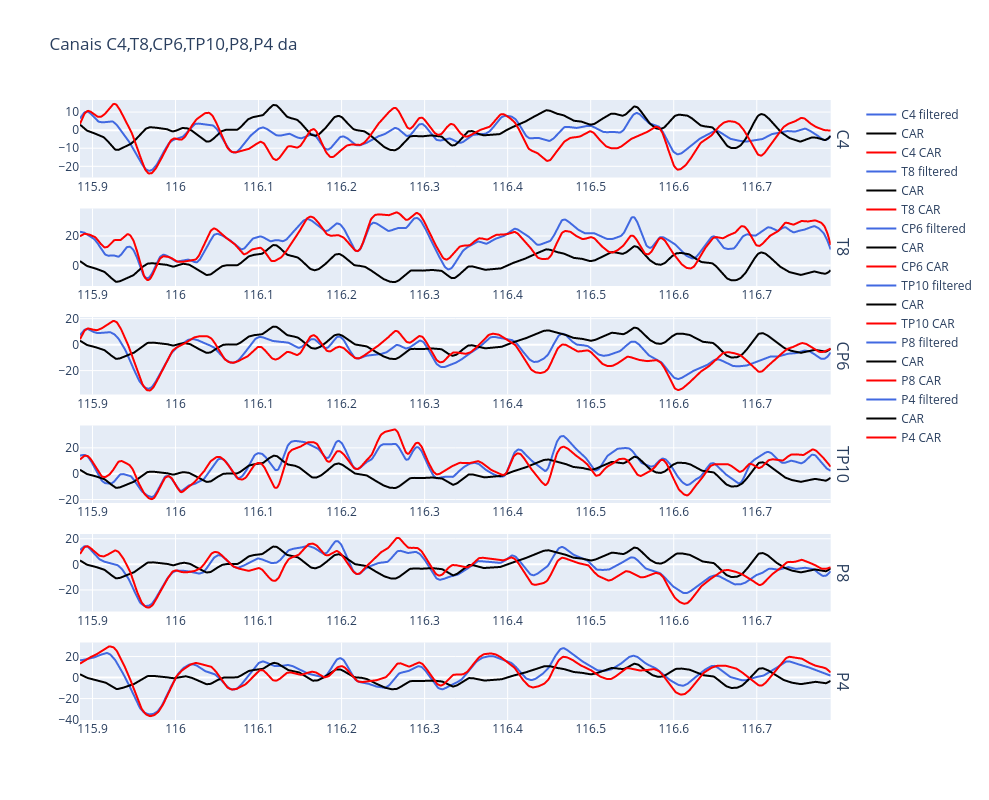

In [51]:
fig = make_subplots(rows=filtered_canais_da_R.shape[1], cols=1 , row_titles=list_channels_right)
i = 0
for channel in filtered_canais_da_R:
    i+=1
    # fig.append_trace(go.Scatter(
    #     x=isa_L_da_eeg_times[0],
    #     y=isa_L_da_eeg_R_channels[0][channel],
    #     name=channel,
    #     line=dict(color='green')
    # ), row=1, col=1)
    
    fig.append_trace(go.Scatter(
        x=isa_L_da_eeg_times[0],
        y=filtered_canais_da_R[channel],
        name=channel + ' filtered',
        line=dict(color='royalblue')
    ), row=i, col=1)

    fig.append_trace(go.Scatter(
        x=isa_L_da_eeg_times[0],
        y=isa_L_da_eeg_CAR_mean_segm[0],
        name='CAR',
        line=dict(color='black')
    ), row=i, col=1)

    fig.append_trace(go.Scatter(
        x=isa_L_da_eeg_times[0],
        y=CAR_canais_da_R[channel],
        name=channel + ' CAR',
        line=dict(color='red')
    ), row=i, col=1)

fig.update_layout(height=800,title_text=f"Canais {','.join(filtered_canais_da_R.columns)} da")

fig.show()


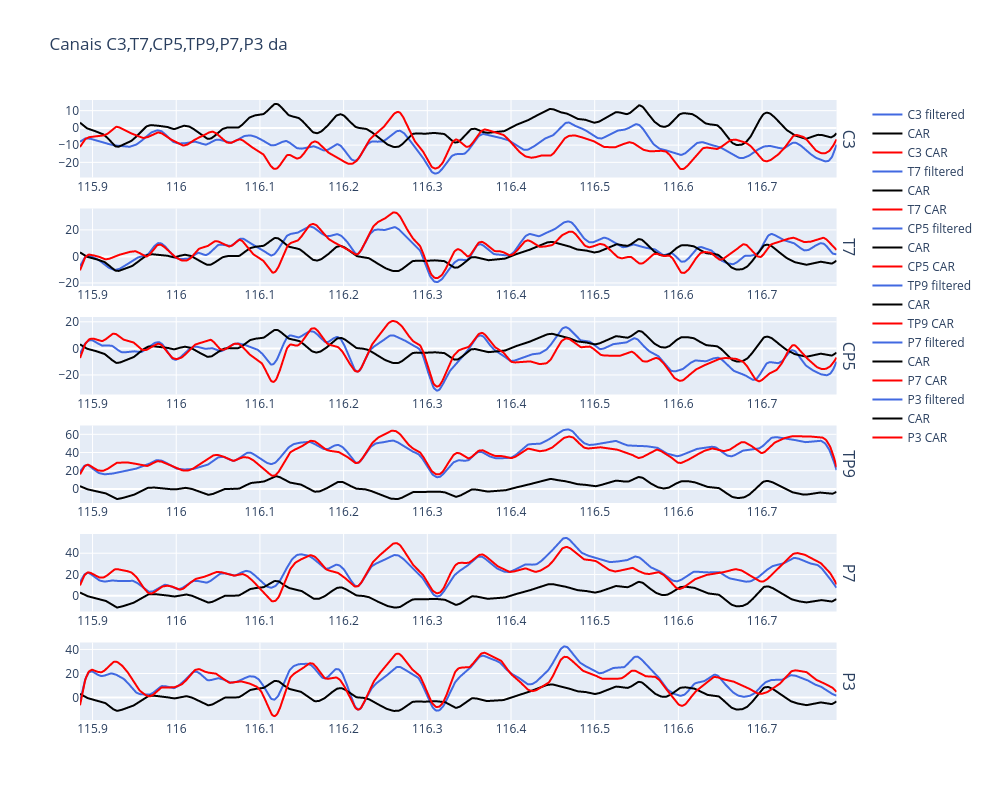

In [52]:
fig = make_subplots(rows=filtered_canais_da_L.shape[1], cols=1 , row_titles=list_channels_left)
i = 0
for channel in filtered_canais_da_L:
    i+=1
    # fig.append_trace(go.Scatter(
    #     x=isa_L_da_eeg_times[0],
    #     y=isa_L_da_eeg_R_channels[0][channel],
    #     name=channel,
    #     line=dict(color='green')
    # ), row=1, col=1)
    
    fig.append_trace(go.Scatter(
        x=isa_L_da_eeg_times[0],
        y=filtered_canais_da_L[channel],
        name=channel + ' filtered',
        line=dict(color='royalblue')
    ), row=i, col=1)

    fig.append_trace(go.Scatter(
        x=isa_L_da_eeg_times[0],
        y=isa_L_da_eeg_CAR_mean_segm[0],
        name='CAR',
        line=dict(color='black')
    ), row=i, col=1)

    fig.append_trace(go.Scatter(
        x=isa_L_da_eeg_times[0],
        y=CAR_canais_da_L[channel],
        name=channel + ' CAR',
        line=dict(color='red')
    ), row=i, col=1)

fig.update_layout(height=800,title_text=f"Canais {','.join(filtered_canais_da_L.columns)} da")

fig.show()

In [53]:
isa_L_ba_eeg_L_channels_y = []
isa_L_ba_eeg_L_channels_CAR = []

for ind, data in enumerate(isa_L_ba_eeg_L_channels):
    y_ba_L = signal.filtfilt(b, a, np.array(data).T)
    y_ba_L = signal.filtfilt(b_notch, a_notch, y_ba_L)
    
    filtered_canais_ba_L = pd.DataFrame(data = y_ba_L.T, columns = list_channels_left)
    CAR_canais_ba_L = filtered_canais_ba_L.sub(isa_L_ba_eeg_CAR_mean_segm[ind], axis = 0)
    
    isa_L_ba_eeg_L_channels_y.append(filtered_canais_ba_L)
    isa_L_ba_eeg_L_channels_CAR.append(CAR_canais_ba_L)

In [54]:
isa_L_ba_eeg_R_channels_y = []
isa_L_ba_eeg_R_channels_CAR = []

for ind, data in enumerate(isa_L_ba_eeg_R_channels):
    y_ba_R = signal.filtfilt(b, a, np.array(data).T)
    y_ba_R = signal.filtfilt(b_notch, a_notch, y_ba_R)
    
    filtered_canais_ba_R = pd.DataFrame(data = y_ba_R.T, columns = list_channels_right)
    CAR_canais_ba_R = filtered_canais_ba_R.sub(isa_L_ba_eeg_CAR_mean_segm[ind], axis = 0)

    isa_L_ba_eeg_R_channels_y.append(filtered_canais_ba_R)
    isa_L_ba_eeg_R_channels_CAR.append(CAR_canais_ba_R)

In [55]:
isa_L_da_eeg_L_channels_y = []
isa_L_da_eeg_L_channels_CAR = []

for ind, data in enumerate(isa_L_da_eeg_L_channels):
    # normalized_canais_da_L = ((data.transpose() - canais_isa_L_mean_L.to_numpy())/canais_isa_L_std_L.to_numpy()).transpose()
    y_da_L = signal.filtfilt(b, a, np.array(data).T)
    y_da_L = signal.filtfilt(b_notch, a_notch, y_da_L)
    
    filtered_canais_da_L = pd.DataFrame(data = y_da_L.T, columns = list_channels_left)
    CAR_canais_da_L = filtered_canais_da_L.sub(isa_L_da_eeg_CAR_mean_segm[ind], axis = 0)
    
    isa_L_da_eeg_L_channels_y.append(filtered_canais_da_L)
    isa_L_da_eeg_L_channels_CAR.append(CAR_canais_da_L)

In [56]:
isa_L_da_eeg_R_channels_y = []
isa_L_da_eeg_R_channels_CAR = []

for ind, data in enumerate(isa_L_da_eeg_R_channels):
    y_da_R = signal.filtfilt(b, a, np.array(data).T)
    y_da_R = signal.filtfilt(b_notch, a_notch, y_da_R)

    filtered_canais_da_R = pd.DataFrame(data = y_da_R.T, columns = list_channels_right)
    CAR_canais_da_R = filtered_canais_da_R.sub(isa_L_da_eeg_CAR_mean_segm[ind], axis = 0)

    isa_L_da_eeg_R_channels_y.append(filtered_canais_da_R)
    isa_L_da_eeg_R_channels_CAR.append(CAR_canais_da_R)

In [57]:
trials_p7_da_L = []
for trial in isa_L_da_eeg_L_channels_y:
    trials_p7_da_L.append(trial['P7'][:800])

In [58]:
trials_p7_ba_L = []
for trial in isa_L_ba_eeg_L_channels_y:
    trials_p7_ba_L.append(trial['P7'][:800])

In [59]:
time_mean = np.arange(-100, 700)

In [60]:
trials_da_L = {}
for channel in list_channels_left:
    trials_da_L[channel] = []
    for trial in isa_L_da_eeg_L_channels_y:
        trials_da_L[channel].append(trial[channel][:800])

In [61]:
trials_da_R = {}
for channel in list_channels_right:
    trials_da_R[channel] = []
    for trial in isa_L_da_eeg_R_channels_y:
        trials_da_R[channel].append(trial[channel][:800])

In [62]:
trials_ba_L = {}
for channel in list_channels_left:
    trials_ba_L[channel] = []
    for trial in isa_L_ba_eeg_L_channels_y:
        trials_ba_L[channel].append(trial[channel][:800])

In [63]:
trials_ba_R = {}
for channel in list_channels_right:
    trials_ba_R[channel] = []
    for trial in isa_L_ba_eeg_R_channels_y:
        trials_ba_R[channel].append(trial[channel][:800])

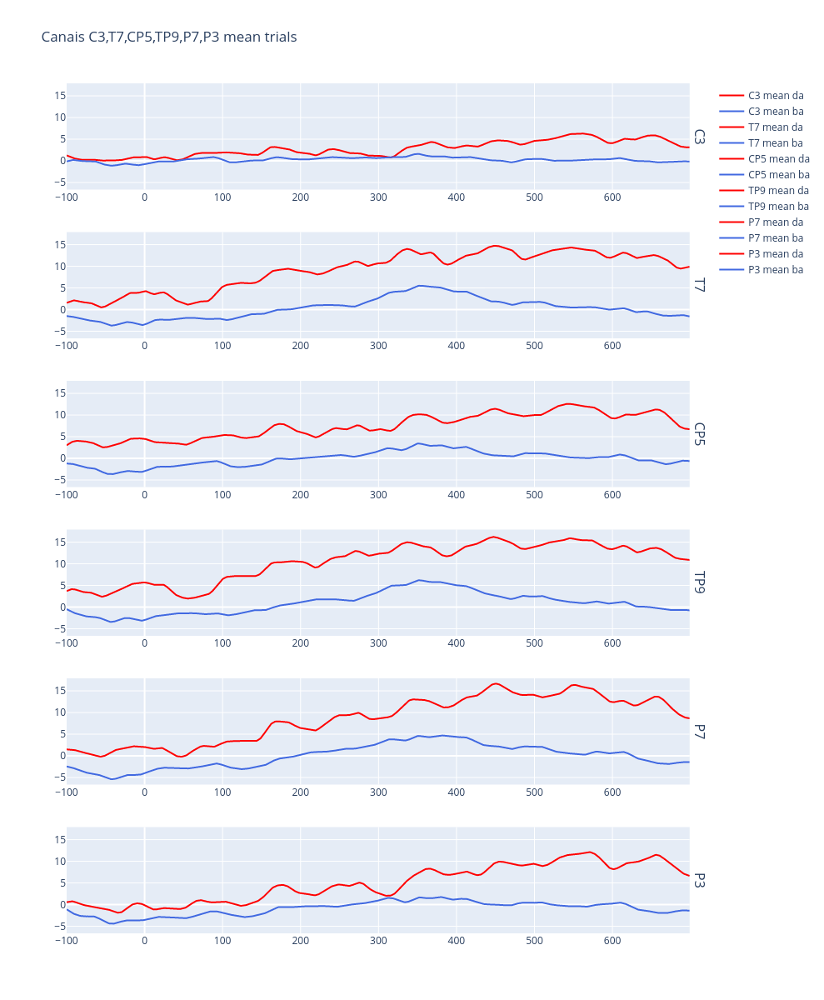

In [64]:

# for ind, trial in enumerate(isa_L_da_eeg_L_channels_CAR):
    
#     fig.append_trace(go.Scatter(
#         x=time_mean,
#         y=trial['P7'],
#         name=f'T{ind}',
#         line=dict(color='royalblue')
#     ), row=1, col=1)
fig = make_subplots(rows=len(list_channels_left), cols=1 , row_titles=list_channels_left, shared_yaxes='columns')
i=0
for channel in list_channels_left:
    i+=1
    fig.append_trace(go.Scatter(
        x=time_mean,
        y=np.array(trials_da_L[channel]).mean(0),
        name=f'{channel} mean da',
        line=dict(color='red')
    ), row=i, col=1)
    fig.append_trace(go.Scatter(
        x=time_mean,
        y=np.array(trials_ba_L[channel]).mean(0),
        name=f'{channel} mean ba',
        line=dict(color='royalblue')
    ), row=i, col=1)
    # fig.append_trace(go.Scatter(
    #     x=time_mean,
    #     y=np.array(trials_da_L[channel]).mean(0)-np.array(trials_ba_L[channel]).mean(0),
    #     name=f'{channel} mean da-ba',
    #     line=dict(color='black')
    # ), row=i, col=1)
fig.update_layout(height=1200,title_text=f"Canais {','.join(list_channels_left)} mean trials")

fig.show()

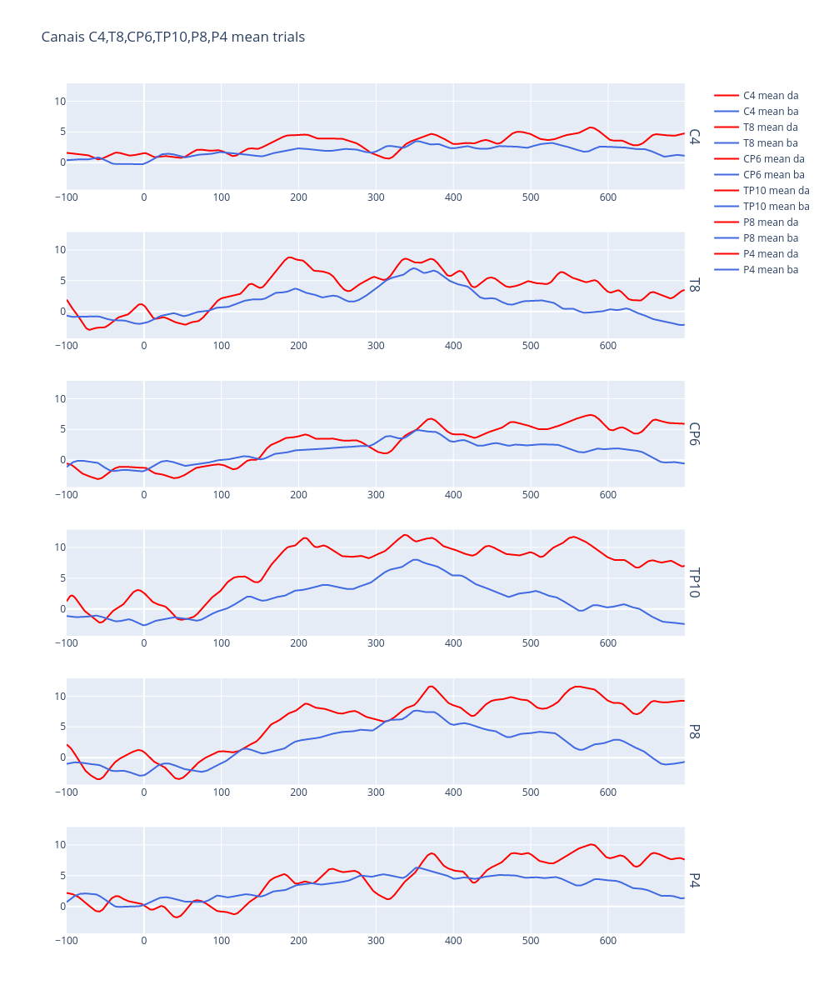

In [65]:
fig = make_subplots(rows=len(list_channels_right), cols=1 , row_titles=list_channels_right, shared_yaxes='columns')
i=0
for channel in list_channels_right:
    i+=1
    fig.append_trace(go.Scatter(
        x=time_mean,
        y=np.array(trials_da_R[channel]).mean(0),
        name=f'{channel} mean da',
        line=dict(color='red')
    ), row=i, col=1)
    fig.append_trace(go.Scatter(
        x=time_mean,
        y=np.array(trials_ba_R[channel]).mean(0),
        name=f'{channel} mean ba',
        line=dict(color='royalblue')
    ), row=i, col=1)
    # fig.append_trace(go.Scatter(
    #     x=time_mean,
    #     y=np.array(trials_da_R[channel]).mean(0)-np.array(trials_ba_R[channel]).mean(0),
    #     name=f'{channel} mean da-ba',
    #     line=dict(color='black')
    # ), row=i, col=1)
fig.update_layout(height=1200,title_text=f"Canais {','.join(list_channels_right)} mean trials")

fig.show()

In [66]:
espectros_y_ba_L = {}
p_shapes_y_ba_L = {}
p_shape_ba_L = {}
espectros_y_ba_L_f = {}

for channel in list_channels_left:
    espectros_y_ba_L[channel] = []
    p_shapes_y_ba_L[channel] = []
    for data_filtered in isa_L_ba_eeg_L_channels_y:
        f_y_ba_L, p = welch(data_filtered[channel], fs=sampling_freq, nperseg=800, noverlap=0)
        p_shapes_y_ba_L[channel].append(p.shape[0])
        espectros_y_ba_L[channel].append(p)

    p_shape_ba_L[channel] = most_common(p_shapes_y_ba_L[channel])

    espectros_y_ba_L_f[channel] = np.array(espectros_y_ba_L[channel])[np.where([espectro.shape[0] == p_shape_ba_L[channel] for espectro in espectros_y_ba_L[channel]])[0]]

    espectros_y_ba_L_f[channel] = np.array([list(espec) for espec in espectros_y_ba_L_f[channel]])

In [67]:
espectros_y_ba_R = {}
p_shapes_y_ba_R = {}
p_shape_ba_R = {}
espectros_y_ba_R_f = {}

for channel in list_channels_right:
    espectros_y_ba_R[channel] = []
    p_shapes_y_ba_R[channel] = []
    for data_filtered in isa_L_ba_eeg_R_channels_y:
        f_y_ba_R, p = welch(data_filtered[channel], fs=sampling_freq, nperseg=800, noverlap=0)
        p_shapes_y_ba_R[channel].append(p.shape[0])
        espectros_y_ba_R[channel].append(p)

    p_shape_ba_R[channel] = most_common(p_shapes_y_ba_R[channel])

    espectros_y_ba_R_f[channel] = np.array(espectros_y_ba_R[channel])[np.where([espectro.shape[0] == p_shape_ba_R[channel] for espectro in espectros_y_ba_R[channel]])[0]]

    espectros_y_ba_R_f[channel] = np.array([list(espec) for espec in espectros_y_ba_R_f[channel]])

In [68]:
espectros_y_da_L = {}
p_shapes_y_da_L = {}
p_shape_da_L = {}
espectros_y_da_L_f = {}

for channel in list_channels_left:
    espectros_y_da_L[channel] = []
    p_shapes_y_da_L[channel] = []
    for data_filtered in isa_L_da_eeg_L_channels_y:
        f_y_da_L, p = welch(data_filtered[channel], fs=sampling_freq, nperseg=800, noverlap=0)
        p_shapes_y_da_L[channel].append(p.shape[0])
        espectros_y_da_L[channel].append(p)

    p_shape_da_L[channel] = most_common(p_shapes_y_da_L[channel])

    espectros_y_da_L_f[channel] = np.array(espectros_y_da_L[channel])[np.where([espectro.shape[0] == p_shape_da_L[channel] for espectro in espectros_y_da_L[channel]])[0]]

    espectros_y_da_L_f[channel] = np.array([list(espec) for espec in espectros_y_da_L_f[channel]])

In [69]:
espectros_y_da_R = {}
p_shapes_y_da_R = {}
p_shape_da_R = {}
espectros_y_da_R_f = {}

for channel in list_channels_right:
    espectros_y_da_R[channel] = []
    p_shapes_y_da_R[channel] = []

    for data_filtered in isa_L_da_eeg_R_channels_y:
        f_y_da_R, p = welch(data_filtered[channel], fs=sampling_freq, nperseg=800, noverlap=0)
        p_shapes_y_da_R[channel].append(p.shape[0])
        espectros_y_da_R[channel].append(p)

    p_shape_da_R[channel] = most_common(p_shapes_y_da_R[channel])

    espectros_y_da_R_f[channel] = np.array(espectros_y_da_R[channel])[np.where([espectro.shape[0] == p_shape_da_R[channel] for espectro in espectros_y_da_R[channel]])[0]]

    espectros_y_da_R_f[channel] = np.array([list(espec) for espec in espectros_y_da_R_f[channel]])

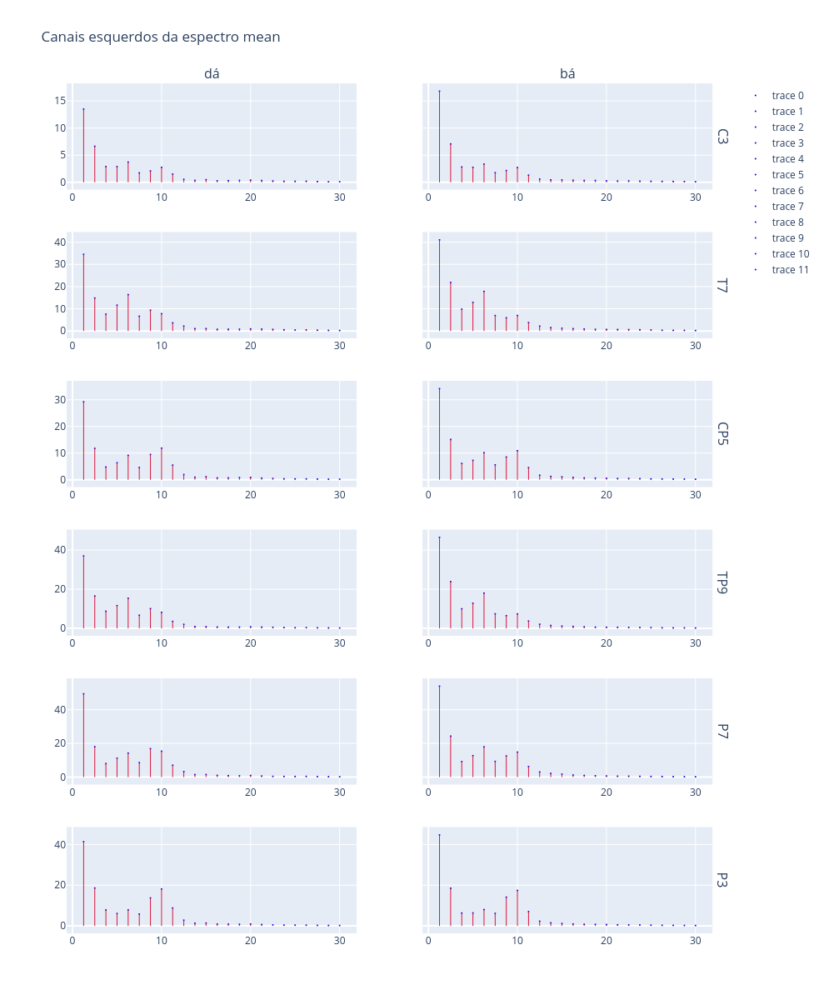

In [70]:
fig2 = make_subplots(rows=len(list_channels_left), cols=2, column_titles=['dá', 'bá'] , row_titles=list_channels_left, shared_yaxes='rows' )
# f, p = welch(trials2_y.iloc[87], fs=fs, nperseg=fs, noverlap=0
j=0
for channel in list_channels_left:
    j+=1
    p = espectros_y_da_L_f[channel].mean(axis=0)

    fmin = .1 # Hz
    fmax = 30 # Hz
    freq_slice = np.where((f_y_da_L >= fmin) & (f_y_da_L <= fmax))

    f = f_y_da_L[freq_slice]
    p = p[freq_slice]

    # fig2 = go.Figure()
    # Draw Points
    fig2.add_trace(
        go.Scatter(
            x = f,
            y = p[0:len(f)],
            mode = 'markers',
            marker_color ='blue',
            marker_size  = 2
        ),
        row=j, col=1
    )
    # # Draw Lines
    for i in range(0, len(f)):
        fig2.add_shape(
            type='line',
            x0 = f[i], y0 = 0,
            x1 = f[i],
            y1 = p[i],
            line=dict(color='crimson', width = 1),
            row=j, col=1
        )
        
j=0
for channel in list_channels_left:
    j+=1
    p = espectros_y_ba_L_f[channel].mean(axis=0)

    fmin = .1 # Hz
    fmax = 30 # Hz
    freq_slice = np.where((f_y_ba_L >= fmin) & (f_y_ba_L <= fmax))

    f = f_y_ba_L[freq_slice]
    p = p[freq_slice]

    # fig2 = go.Figure()
    # Draw Points
    fig2.add_trace(
        go.Scatter(
            x = f,
            y = p[0:len(f)],
            mode = 'markers',
            marker_color ='blue',
            marker_size  = 2
        ),
        row=j, col=2
    )
    # # Draw Lines
    for i in range(0, len(f)):
        fig2.add_shape(
            type='line',
            x0 = f[i], y0 = 0,
            x1 = f[i],
            y1 = p[i],
            line=dict(color='crimson', width = 1),
            row=j, col=2
        )
fig.for_each_annotation(lambda a:  a.update(y = -0.2) if a.text in ['dá', 'bá'] else a.update(x = -0.07) if a.text in list_channels_left else())
fig2.update_layout(height=1200,title_text=f"Canais esquerdos da espectro mean")
fig2.show()

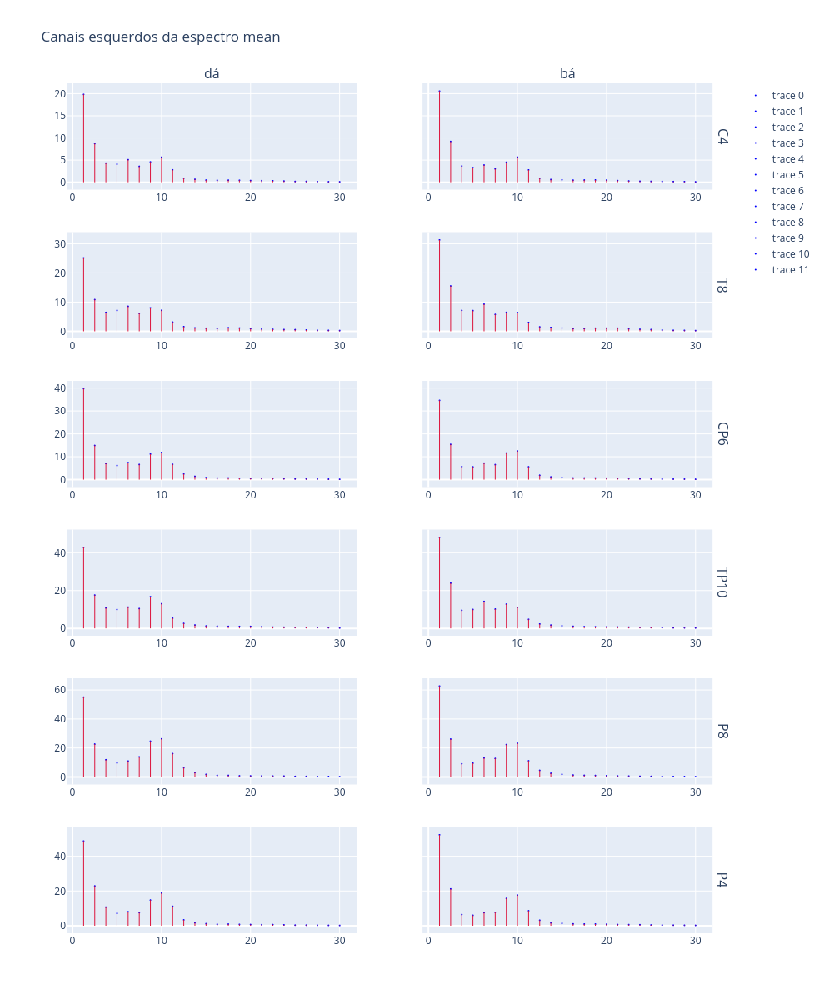

In [71]:
fig2 = make_subplots(rows=len(list_channels_left), cols=2, column_titles=['dá', 'bá'] , row_titles=list_channels_right, shared_yaxes='rows' )
# f, p = welch(trials2_y.iloc[87], fs=fs, nperseg=fs, noverlap=0
j=0
for channel in list_channels_right:
    j+=1
    p = espectros_y_da_R_f[channel].mean(axis=0)

    fmin = .1 # Hz
    fmax = 30 # Hz
    freq_slice = np.where((f_y_da_R >= fmin) & (f_y_da_R <= fmax))

    f = f_y_da_R[freq_slice]
    p = p[freq_slice]

    # fig2 = go.Figure()
    # Draw Points
    fig2.add_trace(
        go.Scatter(
            x = f,
            y = p[0:len(f)],
            mode = 'markers',
            marker_color ='blue',
            marker_size  = 2
        ),
        row=j, col=1
    )
    # # Draw Lines
    for i in range(0, len(f)):
        fig2.add_shape(
            type='line',
            x0 = f[i], y0 = 0,
            x1 = f[i],
            y1 = p[i],
            line=dict(color='crimson', width = 1),
            row=j, col=1
        )
        
j=0
for channel in list_channels_right:
    j+=1
    p = espectros_y_ba_R_f[channel].mean(axis=0)

    fmin = .1 # Hz
    fmax = 30 # Hz
    freq_slice = np.where((f_y_ba_R >= fmin) & (f_y_ba_R <= fmax))

    f = f_y_ba_R[freq_slice]
    p = p[freq_slice]

    # fig2 = go.Figure()
    # Draw Points
    fig2.add_trace(
        go.Scatter(
            x = f,
            y = p[0:len(f)],
            mode = 'markers',
            marker_color ='blue',
            marker_size  = 2
        ),
        row=j, col=2
    )
    # # Draw Lines
    for i in range(0, len(f)):
        fig2.add_shape(
            type='line',
            x0 = f[i], y0 = 0,
            x1 = f[i],
            y1 = p[i],
            line=dict(color='crimson', width = 1),
            row=j, col=2
        )
fig.for_each_annotation(lambda a:  a.update(y = -0.2) if a.text in ['dá', 'bá'] else a.update(x = -0.07) if a.text in list_channels_right else())
fig2.update_layout(height=1200,title_text=f"Canais esquerdos da espectro mean")
fig2.show()

In [72]:
# fc, coh = coherence(np.array(trials_da_L[channelL]).mean(0), np.array(trials_da_R[channelR]).mean(0), fs=sampling_freq)
fc_da, coh_da = signal.coherence(np.array(trials_da_L['P3']).mean(0), np.array(trials_da_R['P4']).mean(0), fs=sampling_freq, noverlap=0)
fc_ba, coh_ba = signal.coherence(np.array(trials_ba_L['P3']).mean(0), np.array(trials_ba_R['P4']).mean(0), fs=sampling_freq, noverlap=0)

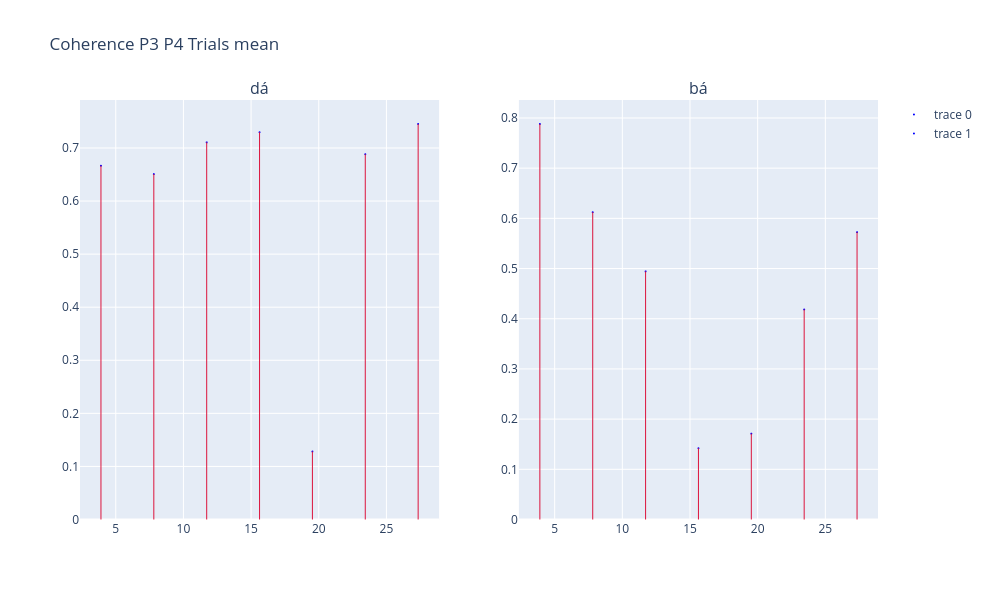

In [73]:
fig2 = make_subplots(rows=1, cols=2, column_titles=['dá', 'bá'])
# Draw Points
fmin = .1 # Hz
fmax = 30 # Hz
freq_slice = np.where((fc_da >= fmin) & (fc_da <= fmax))

f = fc_da[freq_slice]
coh_da = coh_da[freq_slice]

fig2.add_trace(
    go.Scatter(
        x = f,
        y = coh_da[0:len(f)],
        mode = 'markers',
        marker_color ='blue',
        marker_size  = 2
    ),
    row=1, col=1
)
# # Draw Lines
for i in range(0, len(f)):
    fig2.add_shape(
        type='line',
        x0 = f[i], y0 = 0,
        x1 = f[i],
        y1 = coh_da[i],
        line=dict(color='crimson', width = 1),
        row=1, col=1
    )
    
freq_slice = np.where((fc_ba >= fmin) & (fc_ba <= fmax))

f = fc_ba[freq_slice]
coh_ba = coh_ba[freq_slice]
                     
fig2.add_trace(
    go.Scatter(
        x = f,
        y = coh_ba[0:len(f)],
        mode = 'markers',
        marker_color ='blue',
        marker_size  = 2
    ),
    row=1, col=2
)
# # Draw Lines
for i in range(0, len(f)):
    fig2.add_shape(
        type='line',
        x0 = f[i], y0 = 0,
        x1 = f[i],
        y1 = coh_ba[i],
        line=dict(color='crimson', width = 1),
        row=1, col=2
    )
fig2.update_layout(height=600,title_text=f"Coherence P3 P4 Trials mean")

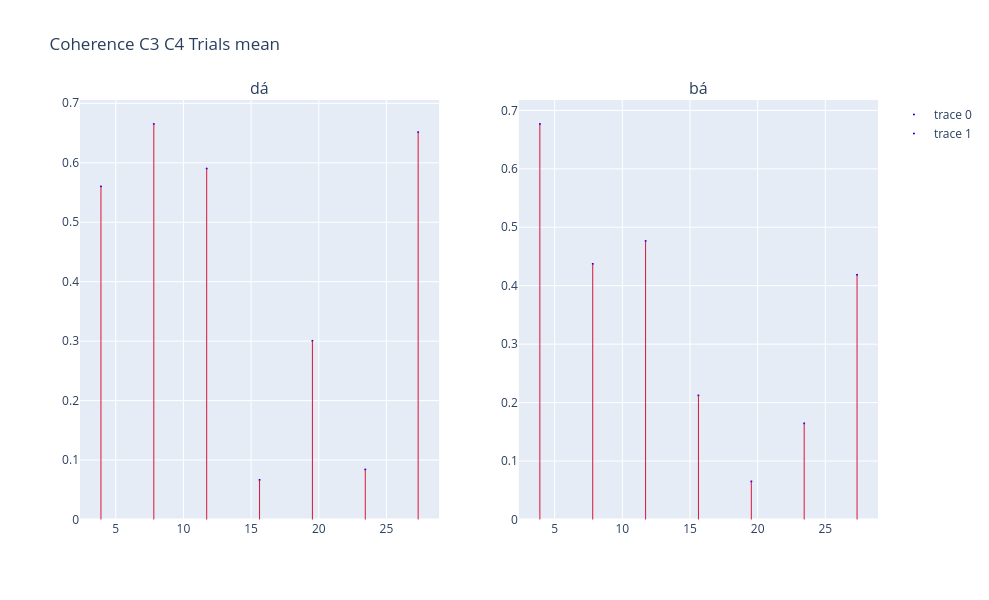

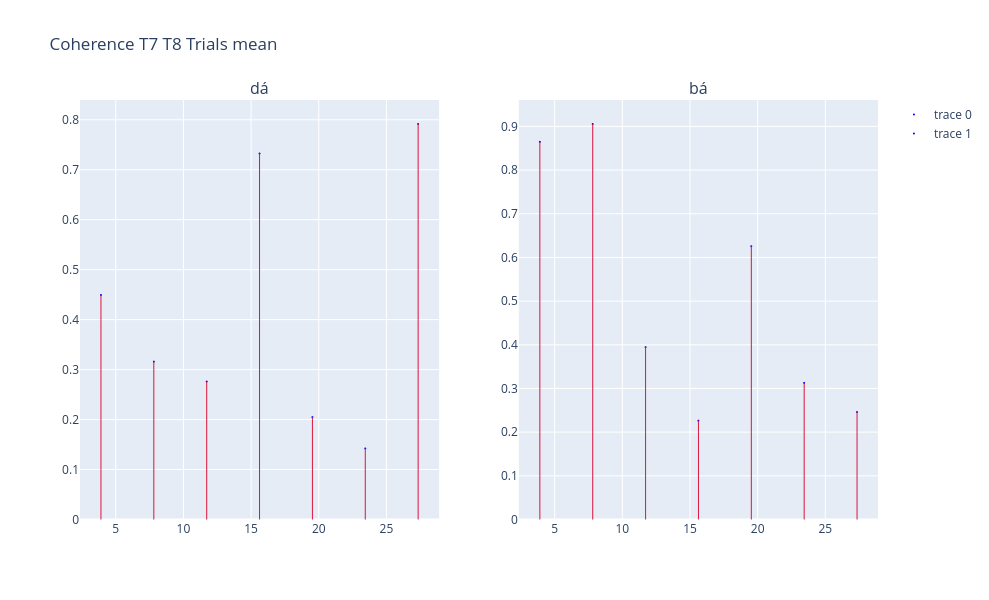

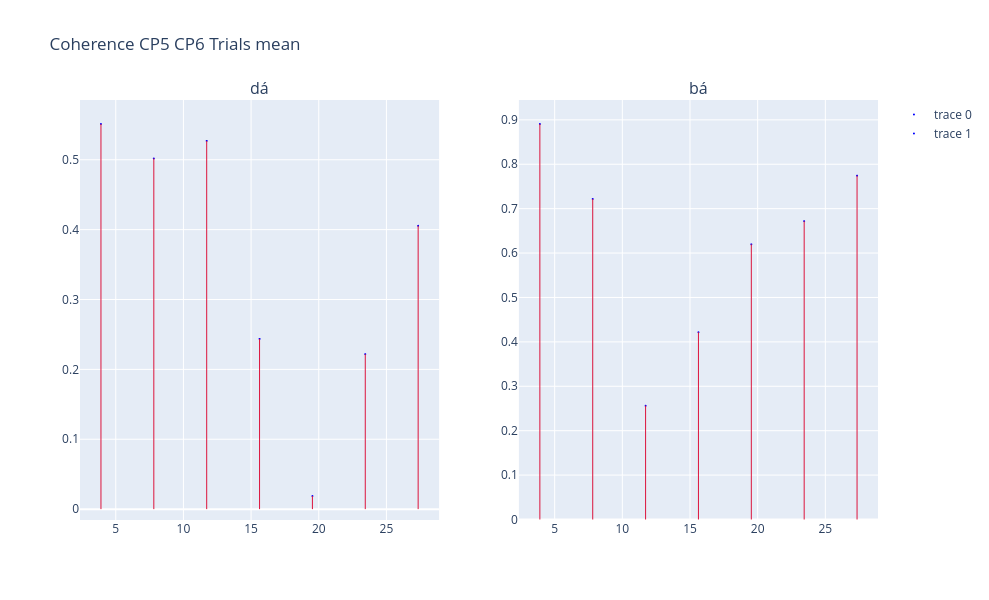

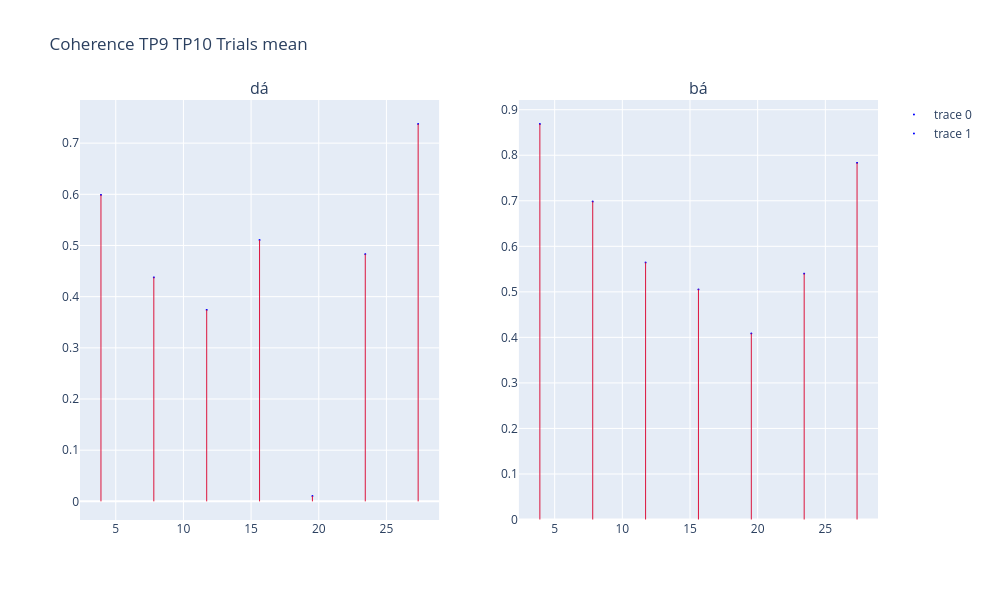

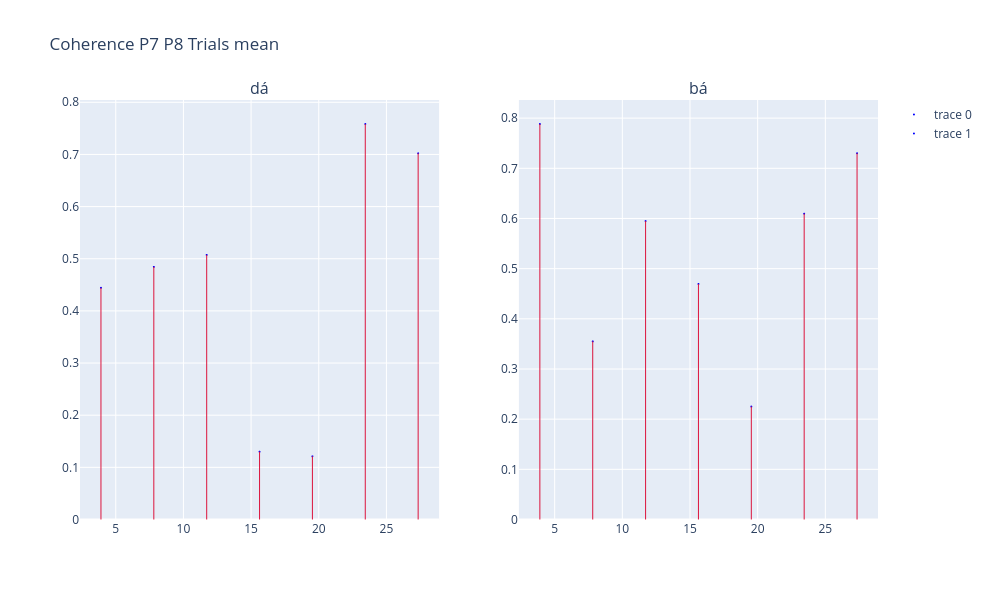

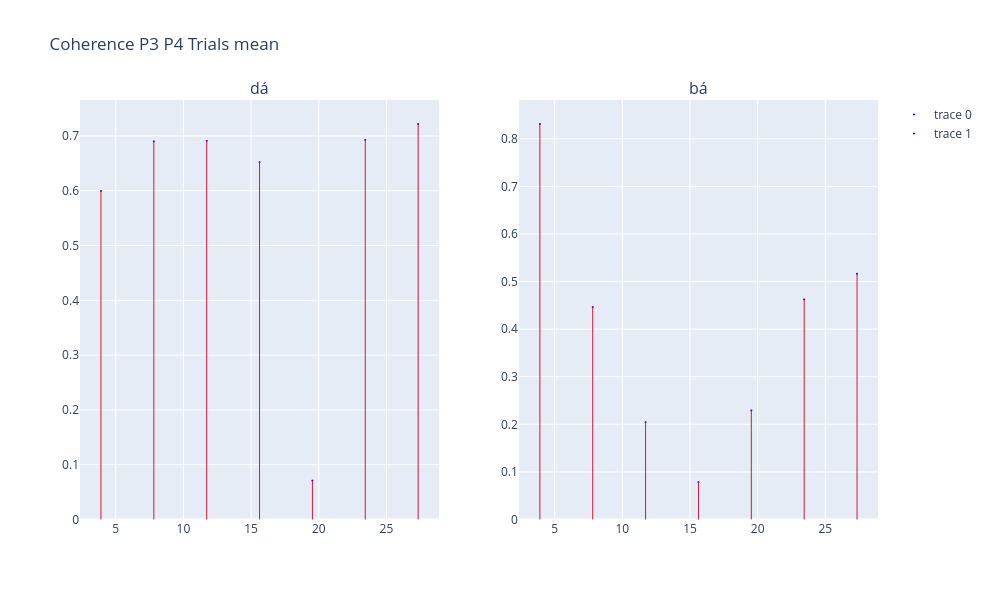

In [74]:
for channelL, channelR in zip(list_channels_left,list_channels_right):
    fc_da, coh_da = signal.coherence(np.array(trials_da_L[channelL]).mean(0), np.array(trials_da_R[channelR]).mean(0), fs=sampling_freq)
    fc_ba, coh_ba = signal.coherence(np.array(trials_ba_L[channelL]).mean(0), np.array(trials_ba_R[channelR]).mean(0), fs=sampling_freq)
    
    fig2 = make_subplots(rows=1, cols=2, column_titles=['dá', 'bá'])
    # Draw Points
    
    fmin = .1 # Hz
    fmax = 30 # Hz
    freq_slice = np.where((fc_da >= fmin) & (fc_da <= fmax))

    f = fc_da[freq_slice]
    coh_da = coh_da[freq_slice]
    
    fig2.add_trace(
        go.Scatter(
            x = f,
            y = coh_da[0:len(f)],
            mode = 'markers',
            marker_color ='blue',
            marker_size  = 2
        ),
        row=1, col=1
    )
    # # Draw Lines
    for i in range(0, len(f)):
        fig2.add_shape(
            type='line',
            x0 = f[i], y0 = 0,
            x1 = f[i],
            y1 = coh_da[i],
            line=dict(color='crimson', width = 1),
            row=1, col=1
        )
        
        
    freq_slice = np.where((fc_ba >= fmin) & (fc_ba <= fmax))

    f = fc_ba[freq_slice]
    coh_ba = coh_ba[freq_slice]

    fig2.add_trace(
        go.Scatter(
            x = f,
            y = coh_ba[0:len(f)],
            mode = 'markers',
            marker_color ='blue',
            marker_size  = 2
        ),
        row=1, col=2
    )
    # # Draw Lines
    for i in range(0, len(f)):
        fig2.add_shape(
            type='line',
            x0 = f[i], y0 = 0,
            x1 = f[i],
            y1 = coh_ba[i],
            line=dict(color='crimson', width = 1),
            row=1, col=2
        )
    fig2.update_layout(height=600,title_text=f"Coherence {channelL} {channelR} Trials mean")
    fig2.show()

In [75]:
coherence_y_da = {}
coh_shapes_y_da = {}
coh_shape_da = {}
coh_y_da_f = {}

for channelL, channelR in zip(list_channels_left,list_channels_right):
    coherence_y_da[f"{channelL}-{channelR}"] = []
    coh_shapes_y_da[f"{channelL}-{channelR}"] = []

    for data_filtered_R, data_filtered_L  in zip(isa_L_da_eeg_R_channels_CAR, isa_L_da_eeg_L_channels_CAR):
        fc_da, coh_da = signal.coherence(data_filtered_L[channelL], data_filtered_R[channelR], fs=sampling_freq)
        # f_y_da_R, p = welch(data_filtered[channel], fs=sampling_freq, nperseg=sampling_freq, noverlap=0)
        coh_shapes_y_da[f"{channelL}-{channelR}"].append(coh_da.shape[0])
        coherence_y_da[f"{channelL}-{channelR}"].append(coh_da)

    coh_shape_da[f"{channelL}-{channelR}"] = most_common(coh_shapes_y_da[f"{channelL}-{channelR}"])

    coh_y_da_f[f"{channelL}-{channelR}"] = np.array(coherence_y_da[f"{channelL}-{channelR}"])[np.where([espectro.shape[0] == coh_shape_da[f"{channelL}-{channelR}"] for espectro in coherence_y_da[f"{channelL}-{channelR}"]])[0]]

    coh_y_da_f[f"{channelL}-{channelR}"] = np.array([list(espec) for espec in coh_y_da_f[f"{channelL}-{channelR}"]])

In [76]:
coherence_y_ba = {}
coh_shapes_y_ba = {}
coh_shape_ba = {}
coh_y_ba_f = {}

for channelL, channelR in zip(list_channels_left,list_channels_right):
    coherence_y_ba[f"{channelL}-{channelR}"] = []
    coh_shapes_y_ba[f"{channelL}-{channelR}"] = []

    for data_filtered_R, data_filtered_L  in zip(isa_L_ba_eeg_R_channels_CAR, isa_L_ba_eeg_L_channels_CAR):
        fc_ba, coh_ba = signal.coherence(data_filtered_L[channelL], data_filtered_R[channelR], fs=sampling_freq)
        # f_y_da_R, p = welch(data_filtered[channel], fs=sampling_freq, nperseg=sampling_freq, noverlap=0)
        coh_shapes_y_ba[f"{channelL}-{channelR}"].append(coh_ba.shape[0])
        coherence_y_ba[f"{channelL}-{channelR}"].append(coh_ba)

    coh_shape_ba[f"{channelL}-{channelR}"] = most_common(coh_shapes_y_ba[f"{channelL}-{channelR}"])

    coh_y_ba_f[f"{channelL}-{channelR}"] = np.array(coherence_y_ba[f"{channelL}-{channelR}"])[np.where([espectro.shape[0] == coh_shape_ba[f"{channelL}-{channelR}"] for espectro in coherence_y_ba[f"{channelL}-{channelR}"]])[0]]

    coh_y_ba_f[f"{channelL}-{channelR}"] = np.array([list(espec) for espec in coh_y_ba_f[f"{channelL}-{channelR}"]])

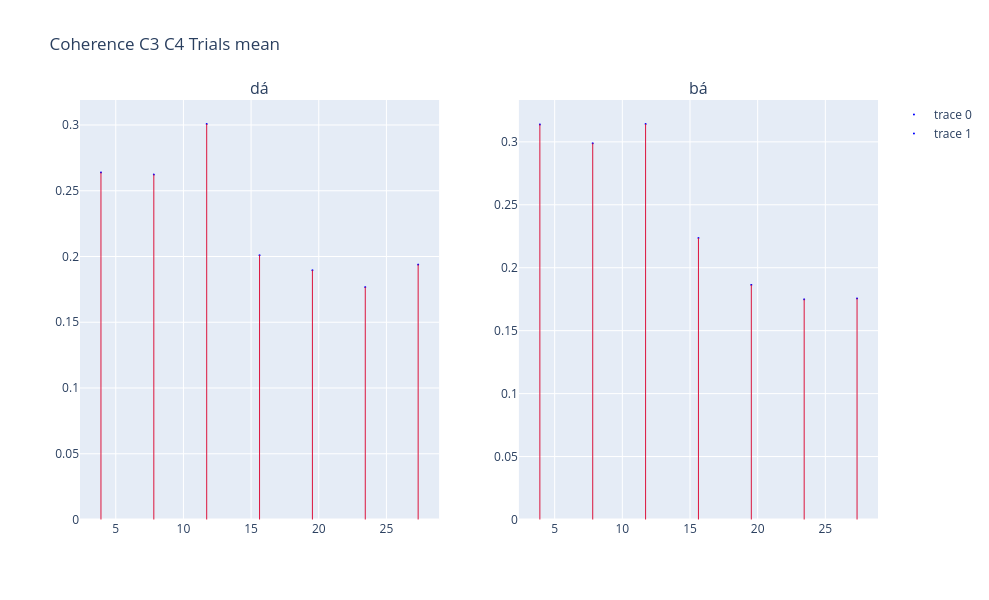

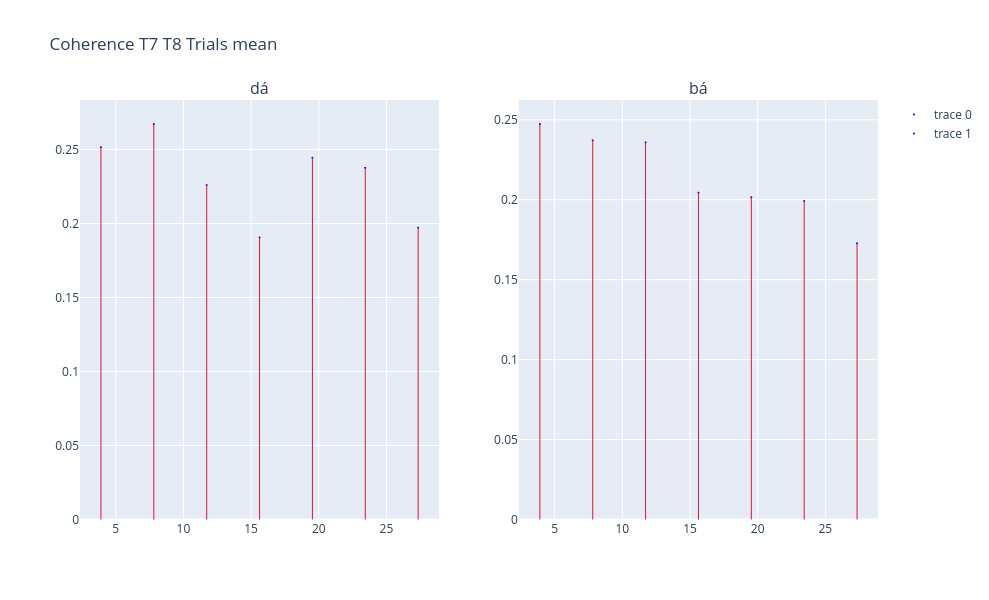

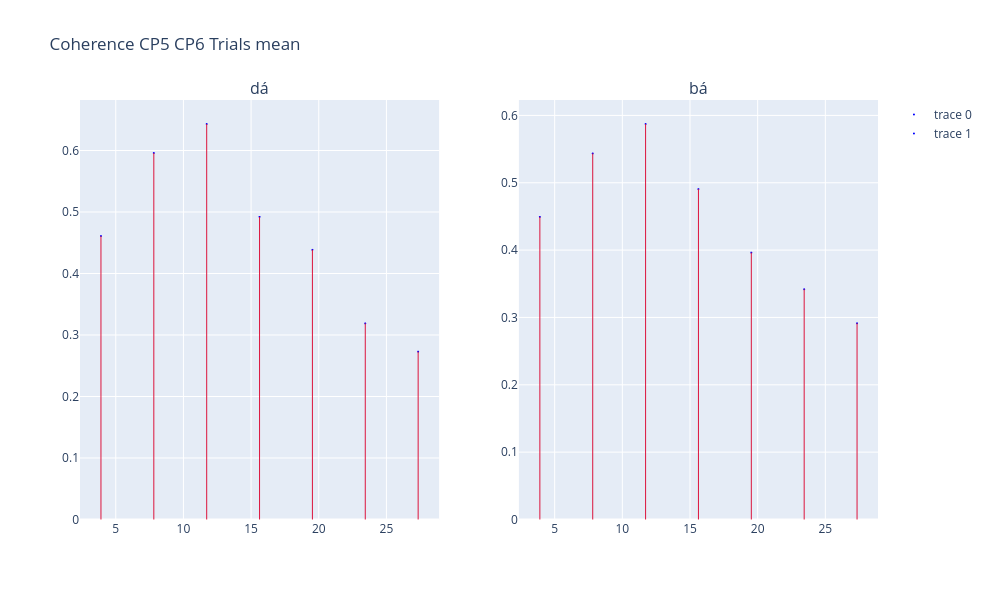

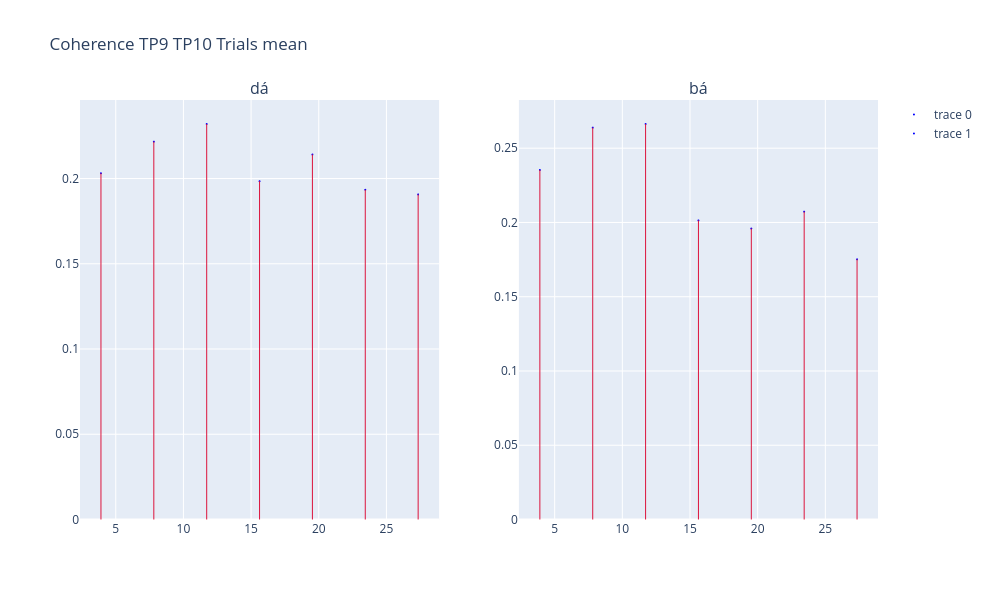

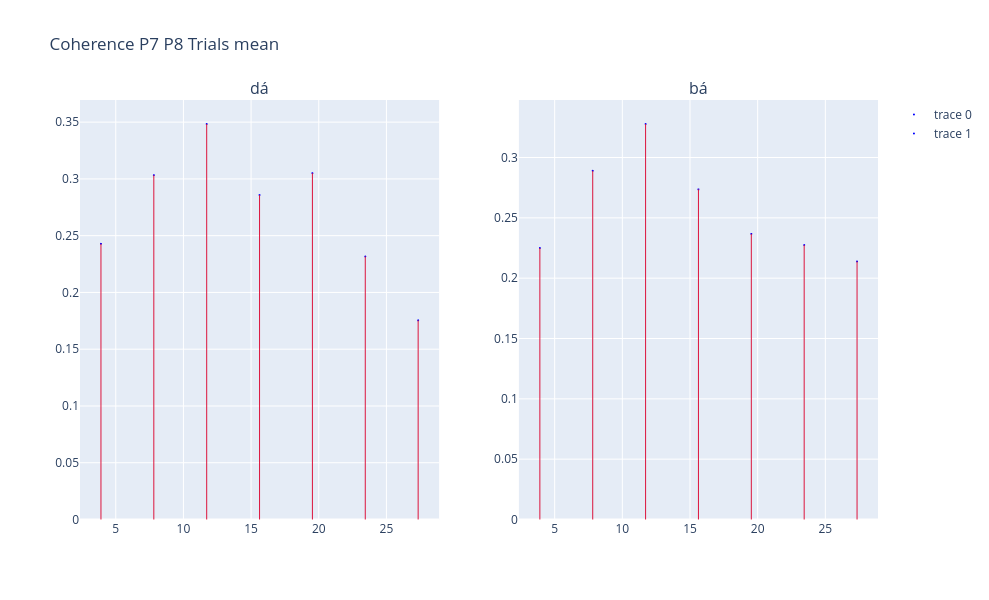

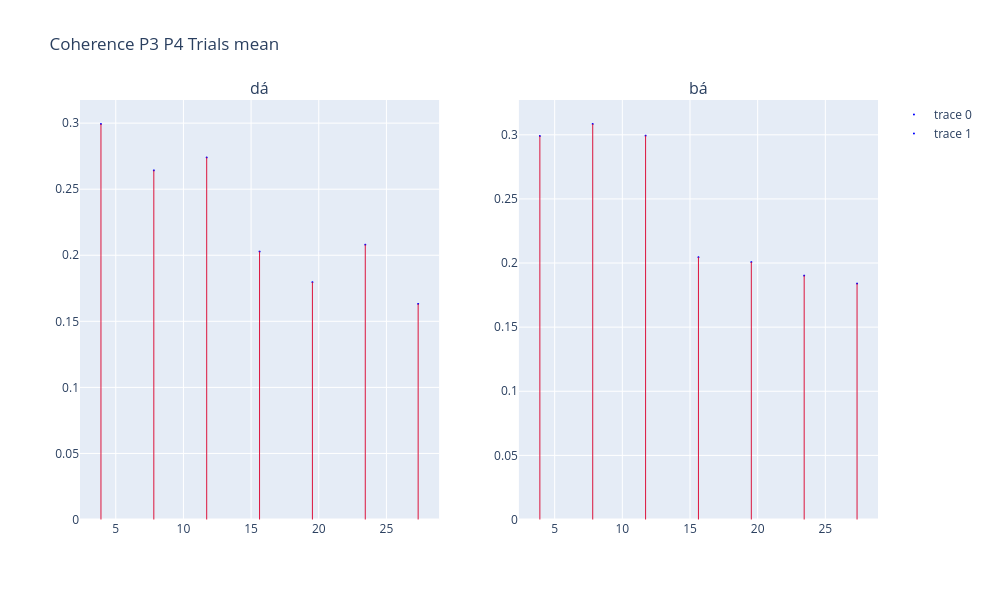

In [77]:
for channelL, channelR in zip(list_channels_left,list_channels_right):
    coh_da = coh_y_da_f[f"{channelL}-{channelR}"].mean(axis=0)
    coh_ba = coh_y_ba_f[f"{channelL}-{channelR}"].mean(axis=0)
    
    fig2 = make_subplots(rows=1, cols=2, column_titles=['dá', 'bá'])
    # Draw Points
    
    fmin = .1 # Hz
    fmax = 30 # Hz
    freq_slice = np.where((fc_da >= fmin) & (fc_da <= fmax))

    f = fc_da[freq_slice]
    coh_da = coh_da[freq_slice]
    
    fig2.add_trace(
        go.Scatter(
            x = f,
            y = coh_da[0:len(f)],
            mode = 'markers',
            marker_color ='blue',
            marker_size  = 2
        ),
        row=1, col=1
    )
    # # Draw Lines
    for i in range(0, len(f)):
        fig2.add_shape(
            type='line',
            x0 = f[i], y0 = 0,
            x1 = f[i],
            y1 = coh_da[i],
            line=dict(color='crimson', width = 1),
            row=1, col=1
        )
        
        
    freq_slice = np.where((fc_ba >= fmin) & (fc_ba <= fmax))

    f = fc_ba[freq_slice]
    coh_ba = coh_ba[freq_slice]

    fig2.add_trace(
        go.Scatter(
            x = f,
            y = coh_ba[0:len(f)],
            mode = 'markers',
            marker_color ='blue',
            marker_size  = 2
        ),
        row=1, col=2
    )
    # # Draw Lines
    for i in range(0, len(f)):
        fig2.add_shape(
            type='line',
            x0 = f[i], y0 = 0,
            x1 = f[i],
            y1 = coh_ba[i],
            line=dict(color='crimson', width = 1),
            row=1, col=2
        )
    fig2.update_layout(height=600,title_text=f"Coherence {channelL} {channelR} Trials mean")
    fig2.show()